### Exercise 1.7

Load the data set for fluid past a cylinder. Each column is a flow field that has been reshaped into a vector.

In [1]:
import scipy.io  # io: imput and output
import numpy as np
import os

In [2]:
# Load the data set for fluid past a cylinder
mat_contents = scipy.io.loadmat(os.path.join('..','Data','CYLINDER_ALL.mat'))

In [3]:
mat_contents.keys()

dict_keys(['__header__', '__version__', '__globals__', 'UALL', 'UEXTRA', 'VALL', 'VEXTRA', 'VORTALL', 'VORTEXTRA', 'm', 'n', 'nx', 'ny'])

In [4]:
vortall = mat_contents['VORTALL']  # multiple vorticity field snapshots

In [5]:
print(type(vortall))

<class 'numpy.ndarray'>


In [6]:
vortall.shape

(89351, 151)

In [7]:
m = int(mat_contents['m'])
n = int(mat_contents['n'])
nt = vortall.shape[1]

print(m)
print(n)
print(nt)

199
449
151


In [8]:
vortall[1:10, 1:5]

array([[-8.89068e-15, -8.94398e-15, -9.10920e-15, -8.61686e-15],
       [-8.94825e-15, -9.03783e-15, -9.18405e-15, -8.58245e-15],
       [-9.05351e-15, -9.21280e-15, -9.11240e-15, -8.40744e-15],
       [-9.14165e-15, -9.44906e-15, -9.30094e-15, -8.30358e-15],
       [-9.36489e-15, -9.66449e-15, -9.42414e-15, -8.43131e-15],
       [-9.54897e-15, -9.77338e-15, -9.51442e-15, -8.61518e-15],
       [-9.61967e-15, -1.00210e-14, -9.75502e-15, -8.72630e-15],
       [-1.00158e-14, -1.02248e-14, -9.78491e-15, -8.71136e-15],
       [-1.02530e-14, -1.04281e-14, -1.00271e-14, -8.87700e-15]])

In [9]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython import display

In [10]:
fig = plt.figure(figsize=(10,5))
ims = []

for i in range(nt):
    im = plt.imshow(np.reshape(vortall[:,i], (n,m)).T, cmap='gray')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True, repeat_delay=1000)
# ani.save('dynamic_vorticity.mp4')
plt.close(ani._fig)
display.HTML(ani.to_jshtml())

(a) Compute the $SVD$ of this data set and plot the singular value spectrum and the leading singular vectors. The $U$ matrix contains eigenflow fields and the $\Sigma V^*$ represents the amplitudes of thses eigenflows as the flow evolves in time.

In [11]:
# Compute the  𝑆𝑉𝐷  of this data set 
U, S, VT = np.linalg.svd(vortall, full_matrices=False)

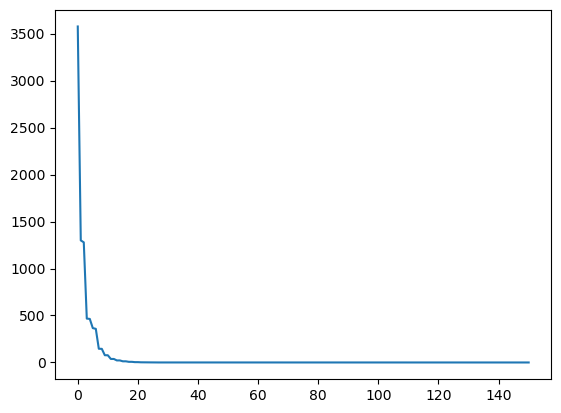

In [12]:
# Plot the singular value spectrum
plt.plot(S)
plt.show()

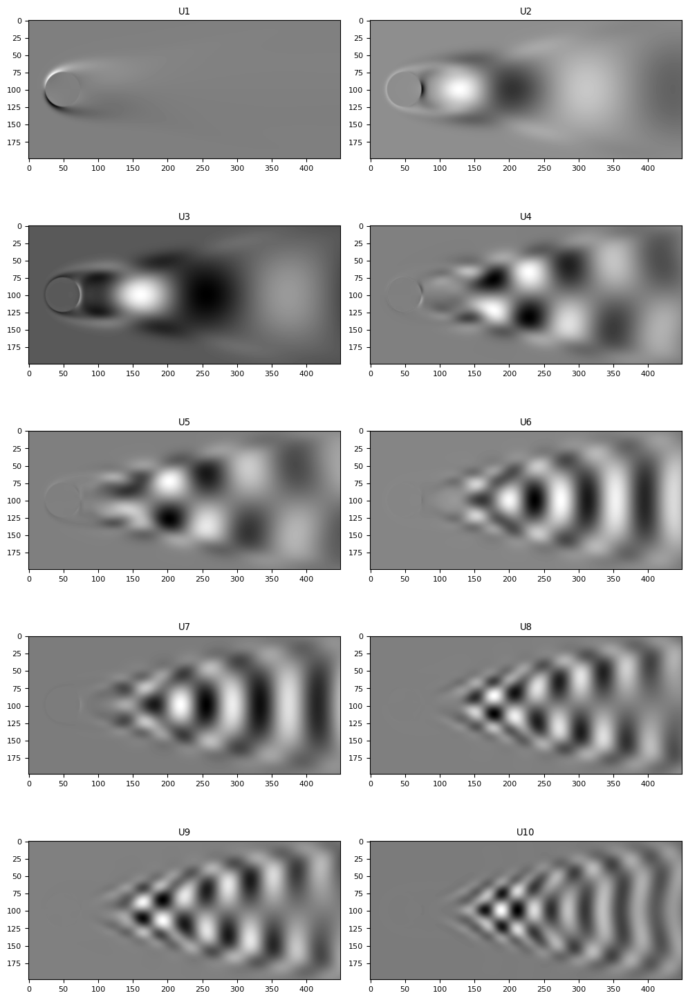

In [13]:
# Plot the leading singular vectors, U[,:r]
r = 10
Ur = U[:,:r]

plt.rcParams['figure.figsize'] = [10, 15]
plt.rcParams.update({'font.size': 8})

rows = 5
cols = 2

axes=[]
fig=plt.figure()

for i in range(rows*cols):
    axes.append( fig.add_subplot(rows, cols, i+1) )
    subplot_title=("U"+str(i+1))
    axes[-1].set_title(subplot_title) 
    plt.imshow(np.reshape(Ur[:,i], (n,m)).T, cmap='gray')

fig.tight_layout()    

(b) Write a code to plot the reconstructed movie for various truncation values $r$. 

Compute the $r$ value needed to capture 90%, 99%, and 99.9% of the flow energy based on the singular value spectrum (recall that energy is given by the Frobenius norm squared).

Plot the movies for each of these truncation values and compare the fidelity. 

Also compute the squared Frobenius norm of the error between the true matrix $X$ and the reconstructed matrix $\tilde{X}$, where $X$ is the flow field movie.

In [14]:
# Function to plot the reconstructed movie for various truncation values 𝑟
def plt_reconstruted_movie(r, U, S, VT, n, m, nt):
    S = np.diag(S)
    vortall_approx = U[:,:r] @ S[:r,:r] @ VT[:r,:] 
    
    fig = plt.figure(figsize=(10, 5))
    ims = []
    
    for i in range(nt):
        im = plt.imshow(np.reshape(vortall_approx[:,i], (n,m)).T, cmap='gray')
        ims.append([im])
    
    ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True, repeat_delay=1000)

    video = ani.to_html5_video()
    html = display.HTML(video)
    # ani.save('dynamic_vorticity_r'+str(r)+'.mp4')
    display.display(html)  
    plt.close()  

In [15]:
# Compute the r value needed to capture 90%, 99%, and 99.9% of the flow energy 
# based on the singular value spectrum
# (recall that energy is given by the Frobenius norm squared)
energy_pct = np.cumsum(S) / np.sum(S)         # Cumulative energy

r90    = np.min(np.where(energy_pct > 0.90))  # Find r to capture 90% energy
r99    = np.min(np.where(energy_pct > 0.99))  # Find r to capture 99% energy
r99pt9 = np.min(np.where(energy_pct > 0.999)) # Find r to capture 99.9% energy

print(r90)
print(r99)
print(r99pt9)

6
13
20


In [16]:
plt_reconstruted_movie(r90, U, S, VT, n, m, nt)

In [17]:
plt_reconstruted_movie(r99, U, S, VT, n, m, nt)

In [18]:
plt_reconstruted_movie(r99pt9, U, S, VT, n, m, nt)

(c) Fix a value $r = 10$ and compute the truncated $SVD$. Each column $w_k \in \mathbb{R}^{10}$ of the matrix $W = \tilde{\Sigma} \tilde{V}^*$ represents the mixture of the first $10$ eigenflows in the $k$th column of $X$.

Verify this by comparing the $k$th snapshot of $X$ with $\tilde{U}w_k$.

In [19]:
r = 10
vortall_approx = U[:,:r] @ np.diag(S)[:r,:r] @ VT[:r,:]

W = np.diag(S)[:r,:r] @ VT[:r,:]

In [20]:
k = 1
X_k  = vortall[:,k]    
Xr_k = vortall_approx[:,k]        
Utilde_wk = U[:,:r] @ W[:,k]    

In [21]:
print(X_k)
print(Xr_k)
print(W[:,k])
print(Utilde_wk)

[-8.81369e-15 -8.89068e-15 -8.94825e-15 ... -1.76447e-02 -2.99358e-02
 -4.12466e-02]
[ 4.38047926e-13 -4.83361561e-14  1.70252419e-13 ... -3.08553188e-02
 -4.09205105e-02 -5.00153178e-02]
[292.2030894  -94.59187118 114.76186187  -7.63510972 -53.69828679
 -37.78049509 -19.47313322 -10.86264648 -12.10420569   1.35650589]
[ 4.38047926e-13 -4.83361561e-14  1.70252419e-13 ... -3.08553188e-02
 -4.09205105e-02 -5.00153178e-02]


(d) Now, build a linear regression model for how the amplitudes $w_k$ evolve in time. This will be a dynamical system:
$$
    w_{k+1} = Aw_k.
$$

Create a matrix $W$ with the first 1 through $m-1$ columns of $\Sigma V^*$ and another matrix $W^{'}$ with the $2$ through $m$ columns of $\Sigma V^*$.

We will now try to solve for a best-fit $A$ matrix so that
$$
    W^{'} \approx AW.
$$

Compute the $SVD$ of $W$ and use this to compute the pseudo-inverse of $W$ to solve for $A$. 

Compute the eigenvalues of $A$ and plot them in the complex plane.

In [22]:
U, S, VT = np.linalg.svd(vortall, full_matrices=False)
print(U.shape)

SVstar = np.diag(S) @ VT
print(SVstar.shape)

W = SVstar[:,:(nt-1)]    # t = 1,...,150
Wprime = SVstar[:,1:nt]  # t = 2,...,151

print(W.shape)
print(Wprime.shape)

(89351, 151)
(151, 151)
(151, 150)
(151, 150)


In [23]:
# Compute the 𝑆𝑉𝐷 of W
Uw, Sw, VTw = np.linalg.svd(W, full_matrices=False) 

# Compute the psudo-inverse of W
Wpinv = VTw.T @ np.diag(1/Sw) @ Uw.T

# Solve for A
A = Wprime @ Wpinv
A.shape

(151, 151)

In [24]:
# Compute the eigenvalues of 𝐴
# help(np.linalg.eig)
A_eigval, A_eigvec = np.linalg.eig(A)

In [25]:
print(A_eigval.shape)
A_eigval[:10]

(151,)


array([0.91483942+0.40381782j, 0.91483942-0.40381782j,
       0.97847826+0.20634992j, 0.97847826-0.20634992j,
       1.        +0.j        , 0.9871745 +0.15035707j,
       0.9871745 -0.15035707j, 0.98824498+0.10331299j,
       0.98824498-0.10331299j, 0.98135216+0.05112838j])

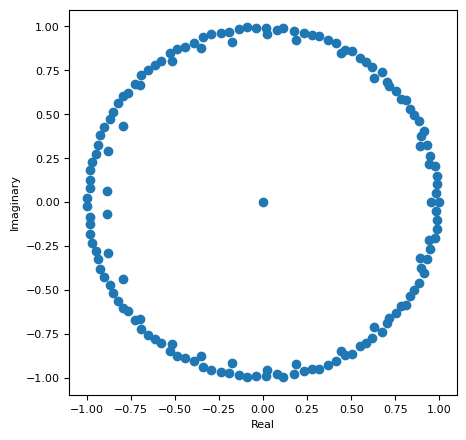

In [26]:
# extract real part 
x = A_eigval.real
# extract imaginary part 
y = A_eigval.imag
  
# plot eigenvalues of 𝐴 in the complex plane
plt.figure(figsize=(5, 5))
plt.scatter(x, y)
plt.ylabel('Imaginary')
plt.xlabel('Real')
plt.show()

(e) Use this $A$ matrix to advance the state $w_k = A^{k-1}w_1$ starting from $w_1$. 

Plot the reconstructed flow field using these predicted amplitude vectors and compare with the true values.

In [27]:
Wpred = np.zeros_like(Wprime)

for i in range(nt-1):
    Wpred[:,i] = np.linalg.matrix_power(A, i+1) @ W[:,1]

In [28]:
print(Wpred.shape)
Wpred

(151, 150)


array([[ 2.92306015e+02,  2.92196880e+02,  2.91872777e+02, ...,
         2.90811234e+02,  2.91368030e+02,  2.91843744e+02],
       [-1.18223985e+02, -1.36590275e+02, -1.48161624e+02, ...,
        -3.11723680e+00, -3.33062858e+01, -6.29335112e+01],
       [ 9.25637527e+01,  6.60364782e+01,  3.65950295e+01, ...,
         1.47072213e+02,  1.43516953e+02,  1.33639880e+02],
       ...,
       [ 3.85648552e-05,  3.44608673e-05,  1.48201862e-05, ...,
        -2.78326949e-05, -2.09944727e-05,  2.17307040e-05],
       [-3.69089848e-05, -1.38298954e-06,  7.71545899e-06, ...,
         2.00788056e-05, -3.86017809e-05,  3.54311409e-06],
       [-4.02739554e-06,  1.37192891e-05,  3.37656434e-05, ...,
         4.28486370e-06,  3.18698883e-05, -3.05498281e-06]])

In [29]:
Wpred = np.insert(Wpred, 0, W[:,1], axis=1)
print(Wpred.shape)
print(U.shape)

(151, 151)
(89351, 151)


In [31]:
print(Wpred)
print(Wprime)

[[ 2.92203089e+02  2.92306015e+02  2.92196880e+02 ...  2.90811234e+02
   2.91368030e+02  2.91843744e+02]
 [-9.45918712e+01 -1.18223985e+02 -1.36590275e+02 ... -3.11723680e+00
  -3.33062858e+01 -6.29335112e+01]
 [ 1.14761862e+02  9.25637527e+01  6.60364782e+01 ...  1.47072213e+02
   1.43516953e+02  1.33639880e+02]
 ...
 [-1.68700788e-05  3.85648552e-05  3.44608673e-05 ... -2.78326949e-05
  -2.09944727e-05  2.17307040e-05]
 [-3.40980621e-05 -3.69089848e-05 -1.38298954e-06 ...  2.00788056e-05
  -3.86017809e-05  3.54311409e-06]
 [-2.45806406e-06 -4.02739554e-06  1.37192891e-05 ...  4.28486370e-06
   3.18698883e-05 -3.05498281e-06]]
[[ 2.92203089e+02  2.92306015e+02  2.92196880e+02 ...  2.90260786e+02
   2.90811234e+02  2.91368030e+02]
 [-9.45918712e+01 -1.18223985e+02 -1.36590275e+02 ...  2.64329378e+01
  -3.11723680e+00 -3.33062858e+01]
 [ 1.14761862e+02  9.25637527e+01  6.60364782e+01 ...  1.44351258e+02
   1.47072213e+02  1.43516953e+02]
 ...
 [-1.68700788e-05  3.85648552e-05  3.4460867

In [30]:
Xpred = U @ Wpred

In [32]:
fig = plt.figure(figsize=(10,5))
ims = []

for i in range(nt):
    im = plt.imshow(np.reshape(Xpred[:,i], (n,m)).T, cmap='gray')
    ims.append([im])

ani = animation.ArtistAnimation(fig, ims, interval=50, blit=True, repeat_delay=1000)
plt.close(ani._fig)
# ani.save('dynamic_vorticity_pred.mp4')
display.HTML(ani.to_jshtml())

In [56]:
X = vortall

(89351, 151)

In [39]:
k = np.array([2, 20, 40, 60, 80, 100, 120, 140, 151]) - 1
k

array([  1,  19,  39,  59,  79,  99, 119, 139, 150])

In [68]:
X_k = X[:,k]
Xpred_k = Xpred[:,k]
X_k.shape

(89351, 9)

In [40]:
X_vs_Xp = np.zeros((m*6, n*3))

In [72]:
for i in range(6):
    for j in range(3):
        if i//2 ==0 :
            X_vs_Xp[i*m:(i+1)*m, j*n:(j+1)*n] = np.reshape(X_k[:,(3*int(i/2))+j], (n,m)).T
        else:
            X_vs_Xp[i*m:(i+1)*m, j*n:(j+1)*n] = np.reshape(Xpred_k[:,(3*int((i-1)/2))+j], (n,m)).T

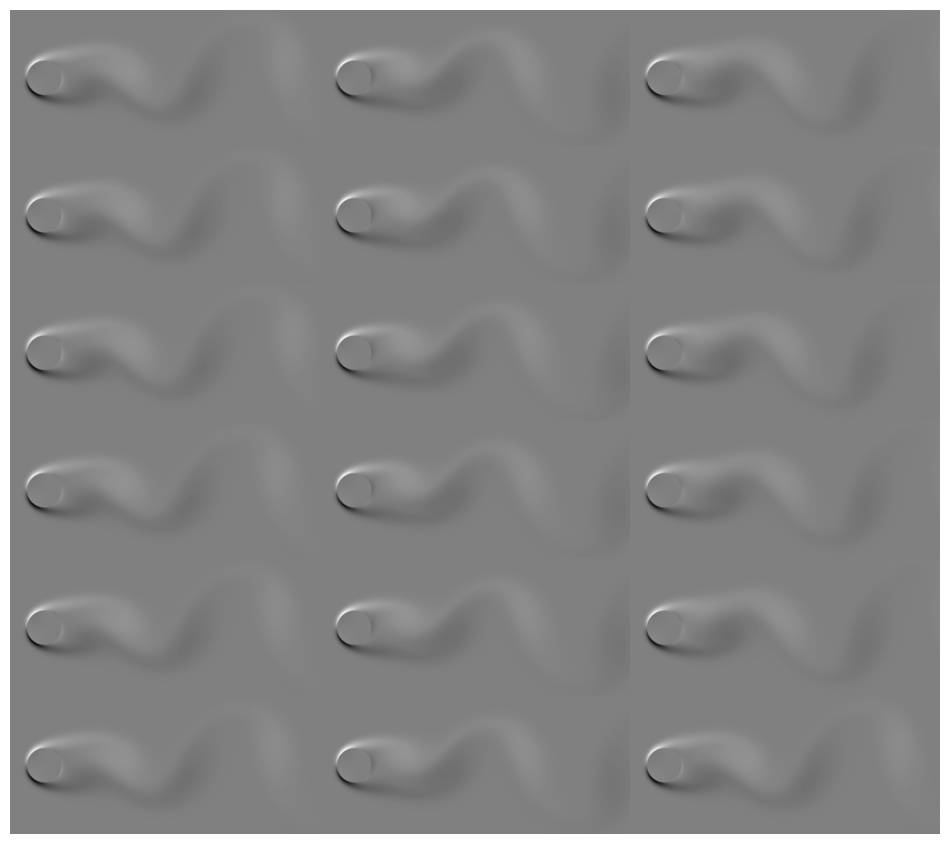

In [73]:
plt.figure(figsize=(12,24))

img = plt.imshow(X_vs_Xp, cmap='gray')
plt.axis('off')
plt.show()